# 图像处理第一次作业
#### 请同学们完成后打包整个文件夹提交到教学网，压缩包命名为“学号_姓名_HW1”

In [1]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

# TODO
# 可以选择添加自己的read/show函数
import os
import cmath
plt.rcParams['font.sans-serif'] = ['SimHei']
plt.rcParams['axes.unicode_minus'] = False       
def my_read(filepath):
    "read a RGB picture"
    img = cv2.imread(filepath)
    return cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

def my_read_gray(filepath):
    "read a gray picture"
    img = cv2.imread(filepath)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    return img, gray   

## Q1: 探索不同灰度级对图像的影响

### 将256个灰度级的图像ctskull.tif分别转化为灰度级为128，64，32，16，8，4和2的图像；
### 使用Matplotlib按照2行4列显示原始和结果图像。

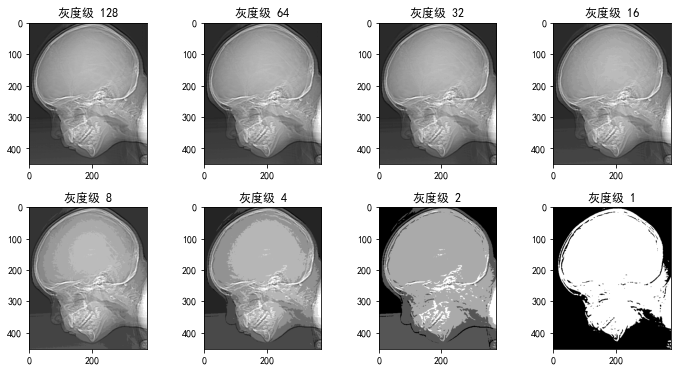

In [2]:
# TODO
path = os.getcwd()
file_path = os.path.join(path, 'ctskull-256.tif')
img, gray= my_read_gray(file_path)
# print(gray)
#print(img)
fig, axes = plt.subplots(2, 4, figsize = (12,6))
plt.subplots_adjust(wspace=0.2, hspace=0.3)
n = 1
axes = axes.flatten()
for axe in axes:
    photo = gray // n
    n*=2
    axe.set_title("灰度级 {}".format(256//n))
    axe.imshow(photo,cmap='gray')


## Q2: 图像解镶嵌

### 1. 读入彩色图像

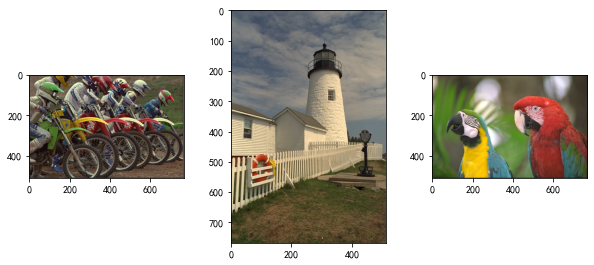

In [3]:
# TODO
kodim05 = my_read(os.path.join(path, 'kodim05.png'))
kodim19 = my_read(os.path.join(path, 'kodim19.png'))
kodim23 = my_read(os.path.join(path, 'kodim23.png'))
fig, axes = plt.subplots(1, 3, figsize = (10, 10))
li = [kodim05, kodim19, kodim23]
axes.flatten()
# print(kodim05.shape)
plt.subplots_adjust(wspace= 0.3)
for axe, img in zip(axes, li):
    # axe.set_axis_off()
    axe.imshow(img)
     

### 2. 按照Bayer模式去除其他两种颜色位置的像素

![jupyter](./pic1.png)

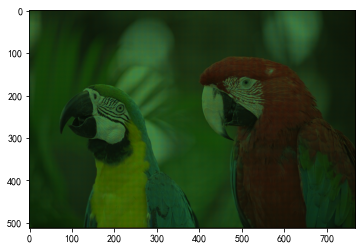

In [4]:
def get_mosaic_image(original_image):
    '''
    Generate the mosaic image using the Bayer Pattern.
    '''
    # TODO
    image_shape = original_image.shape
    H, W, D = image_shape
    red = np.zeros((H,W),dtype=np.int32)
    green = np.zeros((H,W),dtype=np.int32)
    blue = np.zeros((H,W),dtype=np.int32)
    for i in range(H):
        for j in range(W):
            if i%2 == 0 and j%2 ==1:
                red[i, j] = original_image[i, j, 0]
            elif i%2==1 and j%2 ==0:
                blue[i, j] = original_image[i, j, 2]
            else:
                green[i, j] = original_image[i, j, 1]
    mosaic_imgs = np.array([red, green, blue])
    mosaic_imgs = mosaic_imgs.transpose(1, 2, 0)
    
    return mosaic_imgs

# TODO
mosaic_imgs = get_mosaic_image(kodim23)
plt.imshow(mosaic_imgs)
plt.show()

### 3: 线性插值：
#### 通过线性插值方法来进行解镶嵌：对于每个缺失像素，通过平均四个或两个相邻的已知像素值来填充缺失的像素值：

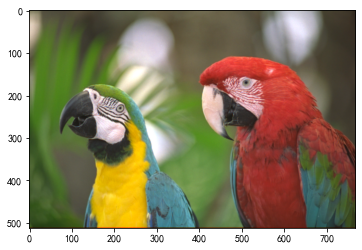

In [5]:
def get_demosaic_image(mosaic_imgs):
    '''
    This function should return the demosaic image.
    Feel free to write helper functions in the above cells
    as well as change the parameters of this function.
    '''
    mosaic_shape = np.shape(mosaic_imgs)
    demosaic_image = np.zeros((mosaic_shape[0], mosaic_shape[1], 3), dtype=np.int32)
    
    ## TODO
    H, W = mosaic_shape[0:2]
    dx = [-1, -1, -1, 0, 0, 1, 1, 1]
    dy = [-1, 0, 1, -1, 1, -1, 0, 1]
    mosaic_imgs = mosaic_imgs.transpose(2,0,1)
    red = mosaic_imgs[0]
    green = mosaic_imgs[1]
    blue = mosaic_imgs[2]
    for i in range(H):
        for j in range(W):
            if i%2 ==0 and j%2 == 1:
                demosaic_image[i, j, 0] = red[i, j]
                cntblue = 0
                cntgreen = 0
                for xx, yy in zip(dx, dy):
                    h = i+xx
                    w = j+yy
                    if h <0 or h>=H or w<0 or w>=W:
                        continue
                    if h%2 ==1 and w%2 ==0:
                        cntblue+=1
                        demosaic_image[i,j,2]+=blue[h,w]
                    elif h%2==w%2:
                        cntgreen+=1
                        demosaic_image[i,j,1]+=green[h,w]
                demosaic_image[i,j,1] //= cntgreen
                demosaic_image[i,j,2] //= cntblue
            elif i%2 ==1 and j%2 ==0:
                demosaic_image[i,j,2] = blue[i,j]
                cntred=0
                cntgreen=0
                for xx, yy in zip(dx, dy):
                    h = i+xx
                    w = j+yy
                    if h <0 or h>=H or w<0 or w>=W:
                        continue
                    if h%2 ==0 and w%2 ==1:
                        cntred+=1
                        demosaic_image[i,j,0]+=red[h,w]
                    elif h%2==w%2:
                        cntgreen+=1
                        demosaic_image[i,j,1]+=green[h,w]
                demosaic_image[i,j,1] //= cntgreen
                demosaic_image[i,j,0] //= cntred
            else:
                demosaic_image[i,j,1] = green[i,j]
                cntred = 0
                cntblue =0
                for xx, yy in zip(dx, dy):
                    h = i+xx
                    w = j+yy
                    if h <0 or h>=H or w<0 or w>=W:
                        continue
                    if h%2 ==0 and w%2 ==1:
                        cntred+=1
                        demosaic_image[i,j,0]+=red[h,w]
                    elif h%2 ==1 and w%2 ==0:
                        cntblue+=1
                        demosaic_image[i,j,2]+=blue[h,w]
                demosaic_image[i,j,2] //= cntblue
                demosaic_image[i,j,0] //= cntred                    
               
    return demosaic_image

# TODO
result_img = get_demosaic_image(mosaic_imgs)
# print(result_img.shape)
# result_path = os.path.join(path, "save.png")

# cv2.imwrite(result_path, cv2.cvtColor(result_img.astype(np.uint8), cv2.COLOR_RGB2BGR))
plt.imshow(result_img)
plt.show()

### 4．分别对kodim05.png, kodim19.png，kodim23.png进行如上解镶嵌, 计算插值误差：
####  pp_err：每个像素的原始颜色值和重建颜色值之间的平方差（三个颜色分量的总和）
####  max_err：每个像素的原始颜色值和重建颜色值之间的最大差值

In [6]:
def compute_errors(demosaic_image, original_image):
    '''
    Compute the Average and Maximum per-pixel error
    for the image.
    '''
    # TODO
    demosaic_image = demosaic_image.astype(np.int32)
    original_image = original_image.astype(np.int32)
    diff_image = demosaic_image - original_image
    diff_image_sqr =np.square(diff_image).sum(axis=2)
    max_err = np.max(np.abs(diff_image))
    pp_err = np.mean(diff_image_sqr)
    return pp_err, max_err

# # TODO
print("kodim05.png")
de_kodim05 = get_demosaic_image(get_mosaic_image(kodim05))
pp_err1, max_err1 = compute_errors(de_kodim05, kodim05)
print(f'pp_err: {pp_err1}')
print(f'max_err: {max_err1}')
print("======================================================")

print("kodim19.png")
de_kodim19 = get_demosaic_image(get_mosaic_image(kodim19))
pp_err2, max_err2 = compute_errors(de_kodim19, kodim19)
print(f'pp_err: {pp_err2}')
print(f'max_err: {max_err2}')
print("======================================================")

print("kodim23.png")
de_kodim23 = get_demosaic_image(get_mosaic_image(kodim23))
pp_err3, max_err3 = compute_errors(de_kodim23, kodim23)
print(f'pp_err: {pp_err3}')
print(f'max_err: {max_err3}')

kodim05.png
pp_err: 443.13732655843097
max_err: 178
kodim19.png
pp_err: 308.713129679362
max_err: 175
kodim23.png
pp_err: 86.42272694905598
max_err: 248


### 5. 显示结果：显示三幅图像的原图、解镶嵌图像和误差图像。

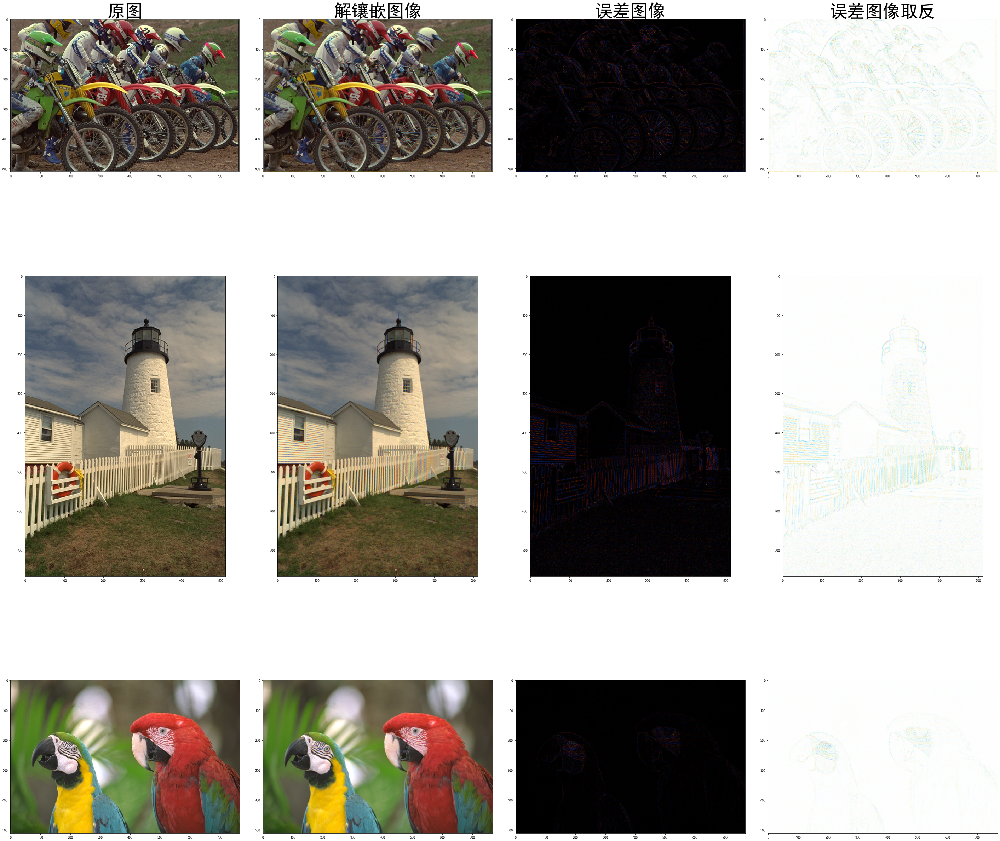

In [7]:
# TODO
fig, axes = plt.subplots(3, 4, figsize = (50, 50))
kodim05.astype(np.int32)
kodim19.astype(np.int32)
kodim23.astype(np.int32)
kodim05_err = np.abs(de_kodim05 - kodim05)
kodim19_err = np.abs(de_kodim19 - kodim19)
kodim23_err = np.abs(de_kodim23 - kodim23)
plt.subplots_adjust(wspace=0.1, hspace= 0.1)
axes[0][0].imshow(kodim05)
axes[0][0].set_title("原图", fontsize=50)
axes[0][1].imshow(de_kodim05)
axes[0][1].set_title("解镶嵌图像", fontsize = 50)
axes[0][2].imshow(kodim05_err)
axes[0][2].set_title("误差图像" ,fontsize = 50)
axes[0][3].set_title("误差图像取反", fontsize = 50)
axes[0][3].imshow(255 - kodim05_err)
axes[1][0].imshow(kodim19)
axes[1][1].imshow(de_kodim19)
axes[1][2].imshow(kodim19_err)
axes[1][3].imshow(255 - kodim19_err)
axes[2][0].imshow(kodim23)
axes[2][1].imshow(de_kodim23)
axes[2][2].imshow(kodim23_err)
axes[2][3].imshow(255 - kodim23_err)
plt.show()

#### 展示解镶嵌图像中伪影特别明显的部分，并解释造成这些伪影的原因。

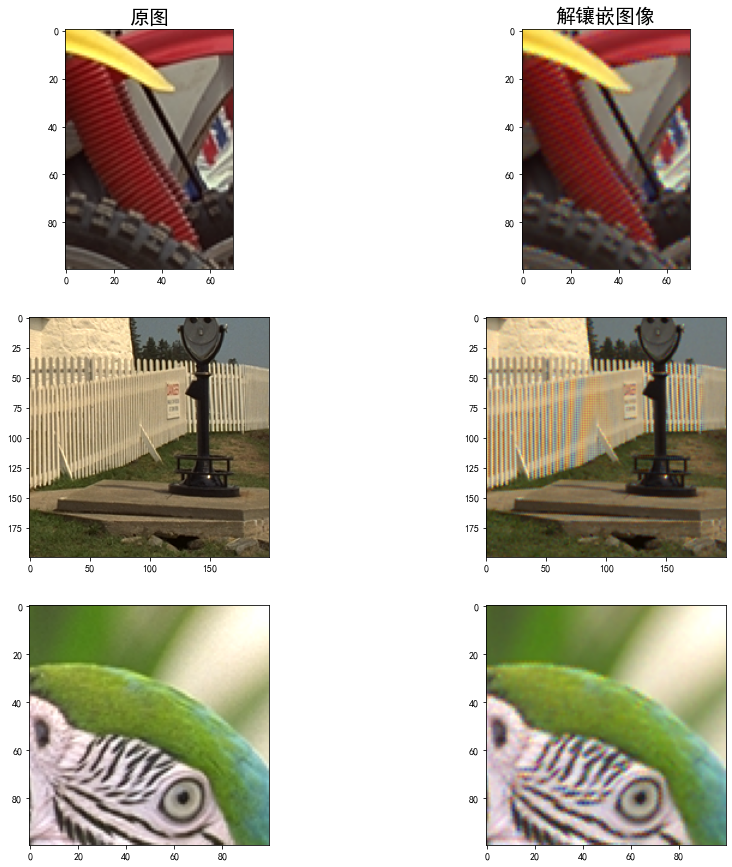

In [8]:
# TODO
fig, axes = plt.subplots(3, 2, figsize = (15, 15))
axes[0][0].set_title("原图",fontsize = 20)
axes[0][1].set_title("解镶嵌图像", fontsize = 20)
axes[0][0].imshow(kodim05[225:325, 350:420, :])
axes[0][1].imshow(de_kodim05[225: 325, 350:420, :])
axes[1][0].imshow(kodim19[400:600, 300:500, :])
axes[1][1].imshow(de_kodim19[400:600, 300:500, :])
axes[2][0].imshow(kodim23[150:250, 150:250, :])
axes[2][1].imshow(de_kodim23[150:250, 150:250, :])
plt.show()

### 上面的解镶嵌过程使用的是双线性内插的方法，通过平均周围像素不同颜色通道取值来得到本像素的颜色通道取值。在进行插值时，周围像素的颜色可能与本像素的颜色差距较大，在插值后得到错误的结果。同时，该方法未考虑各相邻元素之间变化率的影响，具有低通滤波器的性质，使得解镶嵌图像的高频分量受到损失，可能会出现原本不存在的图像，所以出现了伪影。

## Q3: 图像几何变换
#### 注意： 要保留变换后的整体图像

### 1. 读入图像'library.jpg'，设计仿射矩阵M对图像进行“水平翻转并向右平移100个像素”操作，调用cv2.warpAffine()完成变换并展示原图和变换后的图像；

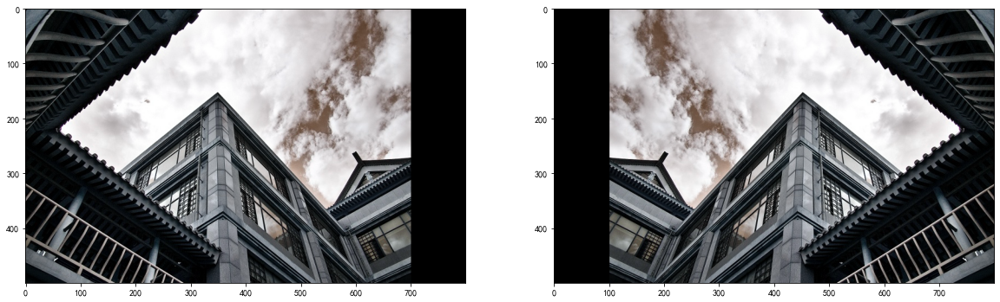

In [9]:
# TODO
M = np.array([[1, 0, 0], [0, 1, 0]], dtype= np.float32)
filepath = os.path.join(path, 'library.jpg')
fig, axes = plt.subplots(1, 2, figsize = (20, 20))
img = cv2.imread(filename=filepath)
H,W, D = img.shape
img1 = cv2.warpAffine(img, M, (W+100 , H))
axes[0].imshow(img1)
a11 = -1
a12 = 0
a13 = W + 100
a21 = 0
a22 = 1
a23 = 0
mat = np.float32([[a11, a12, a13], [a21, a22, a23]])
img2 = cv2.warpAffine(img, mat,(W+100, H))
axes[1].imshow(img2)
plt.show()

### 2. 读入图像'library.jpg'，以图像左下角为旋转中心，使用最近邻插值方式对图像进行顺时针旋转45°，然后平移x = 50, y = 30，展示原图和变换后的图像;

C:\Users\19000\AppData\Local\Temp/ipykernel_7720/1437701234.py:9: ComplexWarning: Casting complex values to real discards the imaginary part
  mar = mar.astype(np.float32)


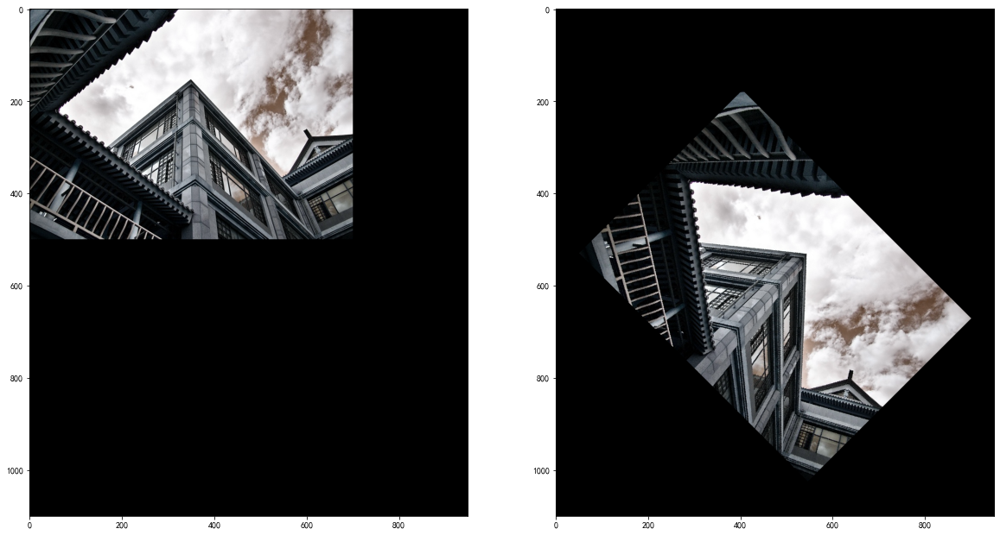

In [10]:
# TODO
fig, axes = plt.subplots(1, 2, figsize = (20, 20))
mar0 = np.array([[1, 0, 50], [0, 1, 30], [0, 0, 1]])
mar1 = np.array([[1, 0, 0], [0, 1, H], [0, 0, 1]])
temp = cmath.sqrt(2)/2
mar2 = np.array([[temp, -temp, 0], [temp, temp, 0], [0, 0, 1]])
mar3 = np.array([[1, 0, 0],[0, 1, -H], [0, 0, 1]])
mar = mar0.dot(np.dot(mar1, np.dot(mar2, mar3)))
mar = mar.astype(np.float32)
img1 = cv2.warpAffine(img, M, (W+250, H+600))
img2 = cv2.warpAffine(img, mar[0: 2, :],(W+250, H+600), flags= cv2.INTER_NEAREST)
axes[0].imshow(img1)
axes[1].imshow(img2)
plt.show()

### 3. 读入图像'library.jpg'，平移x = 50, y = 30，然后以图像左下角为旋转中心，使用双二次插值方式对图像进行顺时针旋转45°，展示原图和变换后的图像;

C:\Users\19000\AppData\Local\Temp/ipykernel_7720/2391060573.py:9: ComplexWarning: Casting complex values to real discards the imaginary part
  mar = mar.astype(np.float32)


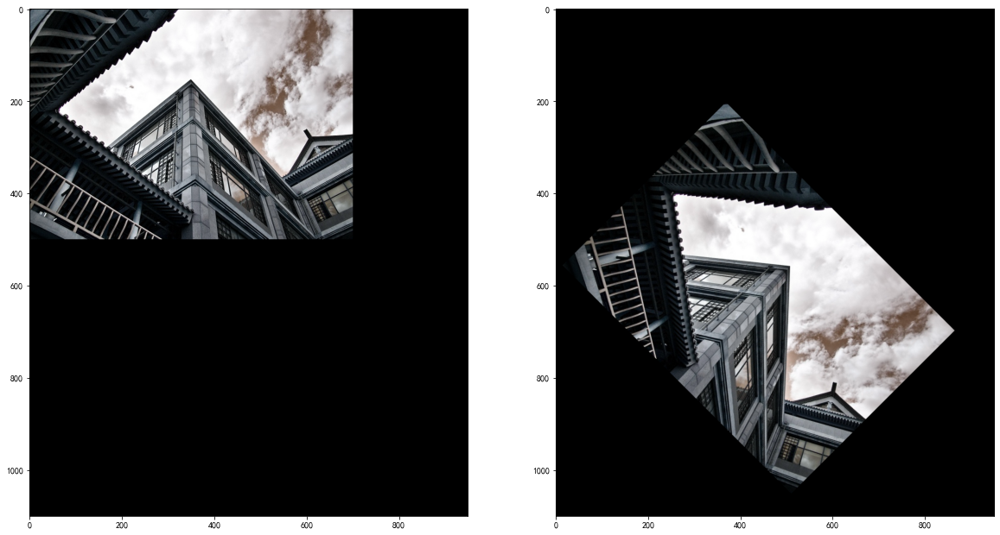

In [11]:
# TODO
fig, axes = plt.subplots(1, 2, figsize = (20, 20))
mar0 = np.array([[1, 0, 50], [0, 1, 30], [0, 0, 1]])
mar1 = np.array([[1, 0, 0], [0, 1, H], [0, 0, 1]])
temp = cmath.sqrt(2)/2
mar2 = np.array([[temp, -temp, 0], [temp, temp, 0], [0, 0, 1]])
mar3 = np.array([[1, 0, 0],[0, 1, -H], [0, 0, 1]])
mar = np.dot((np.dot(mar1, np.dot(mar2, mar3))), mar0)
mar = mar.astype(np.float32)
img1 = cv2.warpAffine(img, M, (W+250, H+600))
img2 = cv2.warpAffine(img, mar[0: 2, :],(W+250, H+600), flags= cv2.INTER_LINEAR)
axes[0].imshow(img1)
axes[1].imshow(img2)
plt.show()

### 4. 比较2和3的结果，并进行说明。

### 在2中，图像的最上面一点位于水平方向的400刻度右方；在3中，图像的最上面一点位于水平方向的400刻度左方。2中图像更偏右上，3中图像更偏左下。因为在2和3中进行的变换顺序不同，先进行平移，后进行旋转时，图像左上角的水平方向的位移更大。在插值方面，2使用的是最近邻插值，只考虑采样点最近的像素的颜色值，计算比较粗糙，颜色有明显的不连续性，在边缘处容易产生马赛克或者锯齿；3采用双二次插值，加大了计算量，但因为不考虑相邻元素之间变化率的影响，损失了高频分量，边缘处也变得模糊。（可以从图片中窗户或者屋檐的边缘处看出）。